<p align="center">
  <img width="300" height="290" src="https://i.imgur.com/mu6ZuGT.jpg">
</p>

<h1><b>TC4033</b></h1>
<h1><b>Visión computacional para imágenes y video</b></h1>
<h3><b>3.2 Google Colab -  Algoritmos de mejoramiento de imágenes en el dominio espacial</b></h3>
<h3><b>Docentes:</b> Dr. Gilberto Ochoa Ruiz, Mtra. María Guadalupe Marcos Abularach</h3>

<h2><b>Equipo 30:</b></h2>

- Julio Baltazar Colín: A01794476
- Helmy Andrea Moreno Navarro: A01793918
- Maricel Parra Osorio - A01793932
- Yeison Fernando Villamil Franco: A01793803

_________________________

# 10. Morphological Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Erosion](#erosion)
3. [Dilation](#dilation)
4. [Opening](#opening)
5. [Closing](#closing)
6. [Morphological Gradient](#gradient)
7. [Morphological Hats](#hats)
   1. [Top or White Hat](#top)
   1. [Black Hat](#black)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [45]:
img1.shape

(768, 960, 3)

In [13]:
img = cv2.imread("../data/semana_2/alebrije.jpg")
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("../data/semana_2/alebrije.jpg",0)

(768, 960, 3) (768, 960, 3) (768, 960)


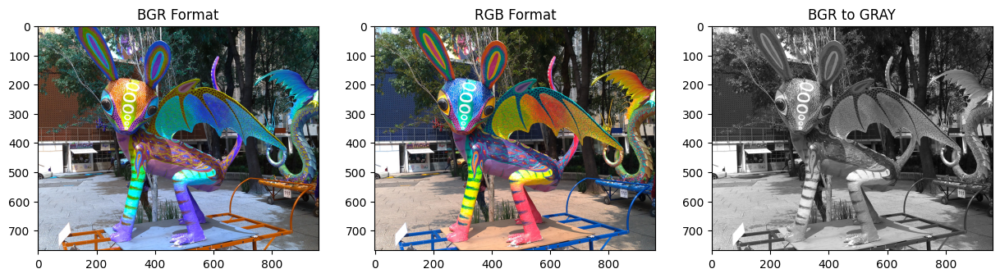

In [14]:
#function to see image
def imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3):
    print(img.shape,img1.shape,img2.shape)
    fig = plt.figure(figsize=(15,8))
    #adds a subplot at 1st position
    fig.add_subplot(rows,columns,1)
    plt.title('BGR Format')
    plt.imshow(img)

    #adds a subplot at 2nd position
    fig.add_subplot(rows,columns,2)
    plt.title('RGB Format')
    plt.imshow(img1)

    #adds a subplot at 3rd position
    fig.add_subplot(rows,columns, 3)
    plt.title('BGR to GRAY')
    plt.imshow(img2,cmap="gray")
    plt.show()
    
imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3)

## Erosion <a class="anchor" id="erosion" ></a>

Erosin primarily involves eroding(thinning) outer surface(foreground) of image
- Tt is suggested to have foreground as white

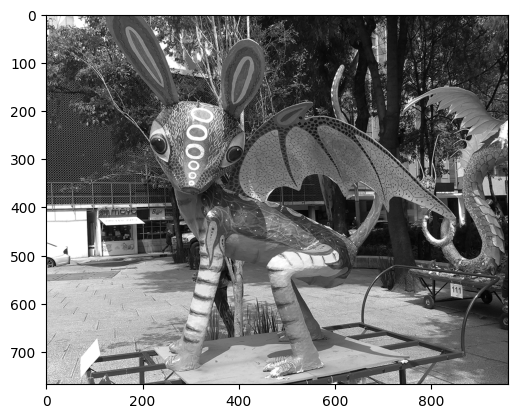

In [16]:
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.imshow(BGR2GRAY,cmap="gray")
plt.show()

Eroding boundy of image upto 3 level

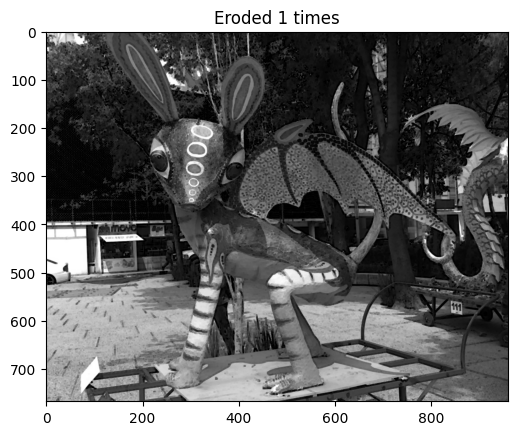

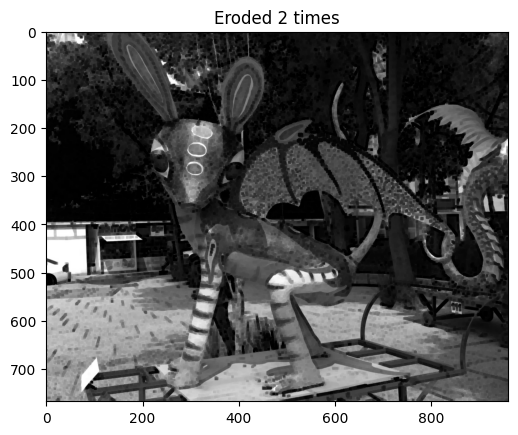

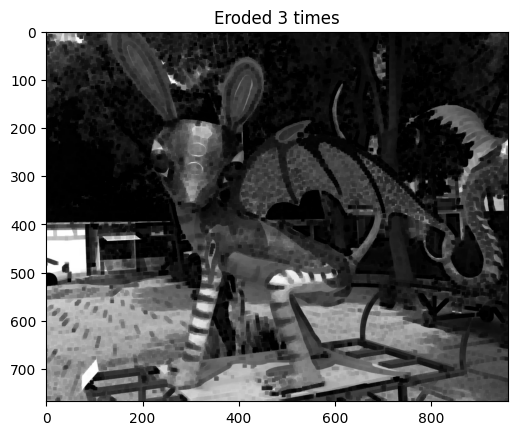

In [17]:
def plt_imshow(title, image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.title(title)
    plt.grid(False)
    plt.show()
    
for i in range(0,3):
    eroded = cv2.erode(BGR2GRAY.copy(), None, iterations=i+1)
    plt_imshow("Eroded {} times".format(i+1), eroded)

### Binarize Image

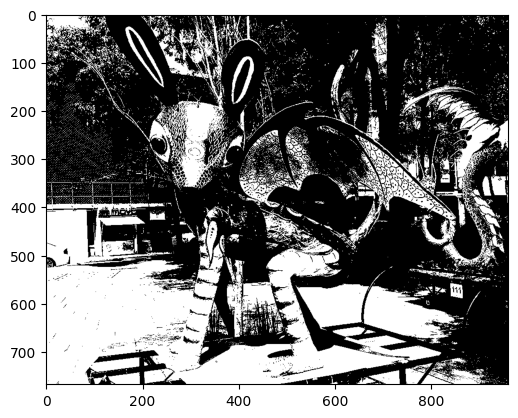

In [19]:
binr = cv2.threshold(BGR2GRAY, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
image = cv2.cvtColor(binr, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

### We can Invert Image to keep foreground in white

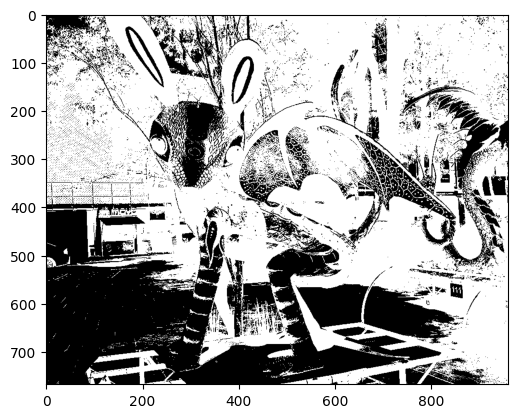

In [20]:
invert = cv2.bitwise_not(binr)
image = cv2.cvtColor(invert, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

Then, we can define a kernel of $5 \times 5$ to use in erosion

In [21]:
kernel = np.ones((5,5), np.uint8) #check for 3*3 or 7*7 kernel size too
print(kernel)

[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


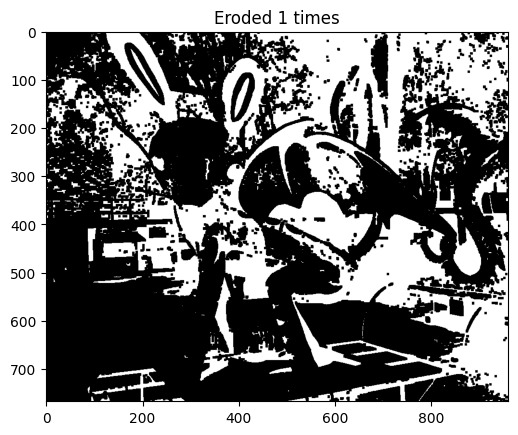

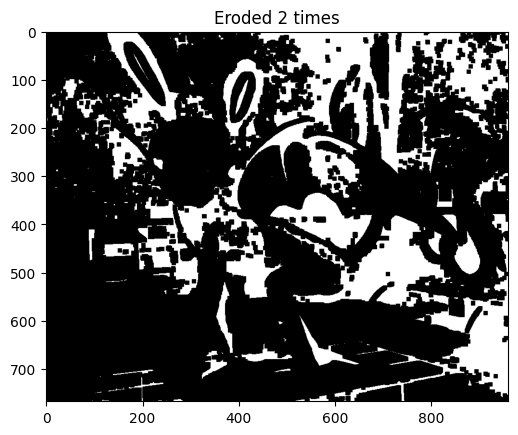

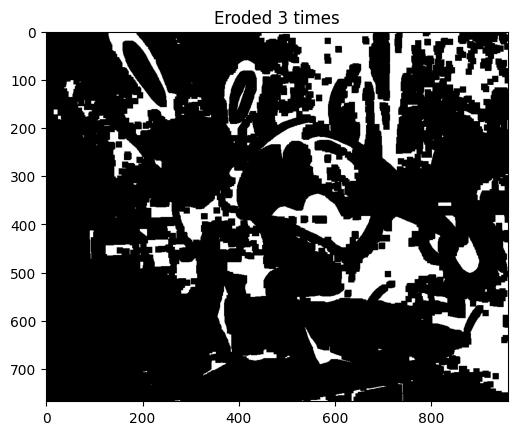

In [22]:
for i in range(0,3):
    eroded = cv2.erode(invert.copy(),kernel=kernel, iterations=i+1)
    plt_imshow("Eroded {} times".format(i+1), eroded)

## Dilation <a class="anchor" id="dilation" ></a>

Involves dilating outer surface (foreground) of image
- For joining broken parts of an image together

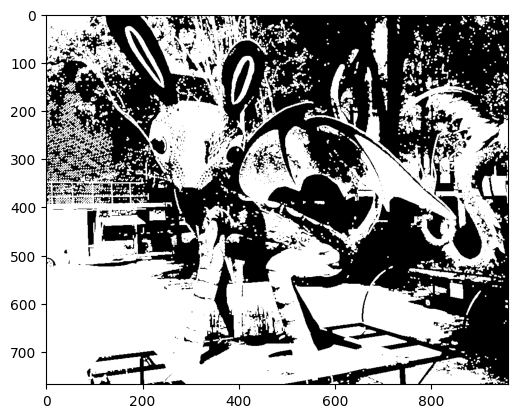

In [23]:
#binarize image
binr = cv2.threshold(BGR2GRAY,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
kernel = np.ones((3,3),np.uint8)
invert = cv2.bitwise_not(binr)

#dilate image
dilation = cv2.dilate(binr, kernel, iterations=1)
 
plt.imshow(dilation, cmap='gray')
plt.show()

We can apply series of dilations on inverted image using no kernel


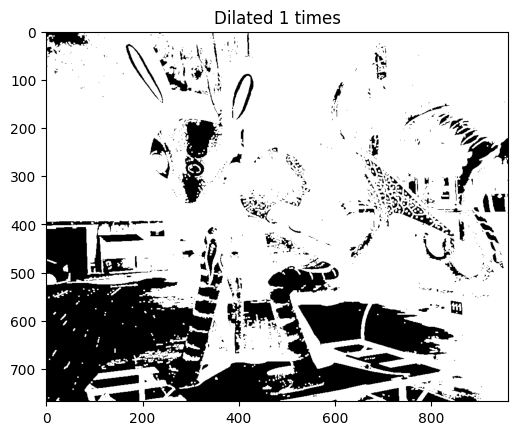

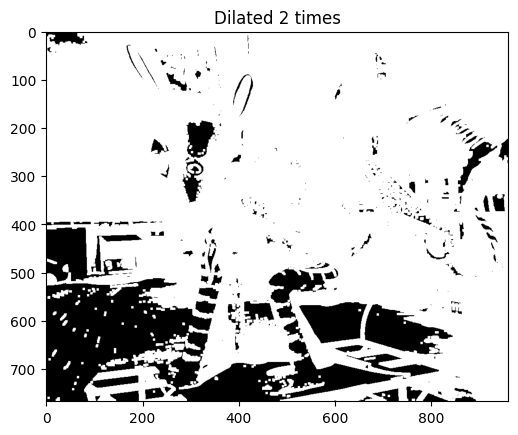

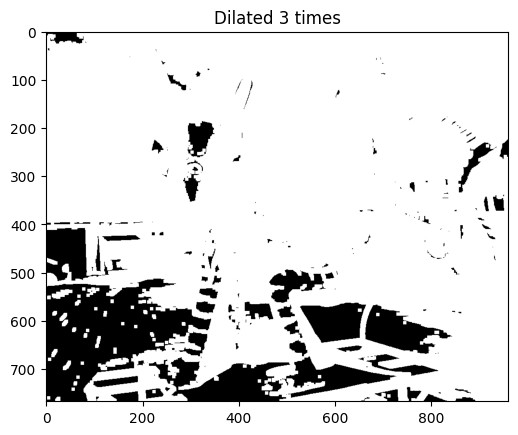

In [24]:
for i in range(0,3):
    dilated = cv2.dilate(invert.copy(),None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),dilated)

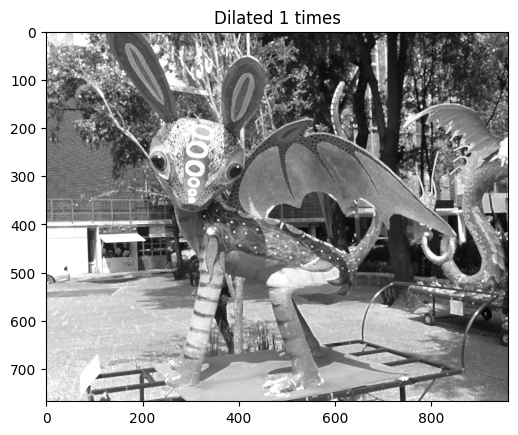

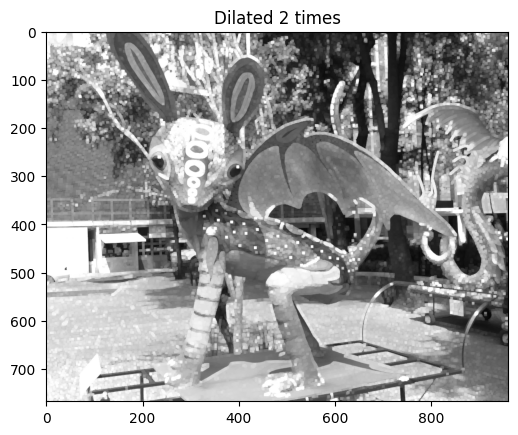

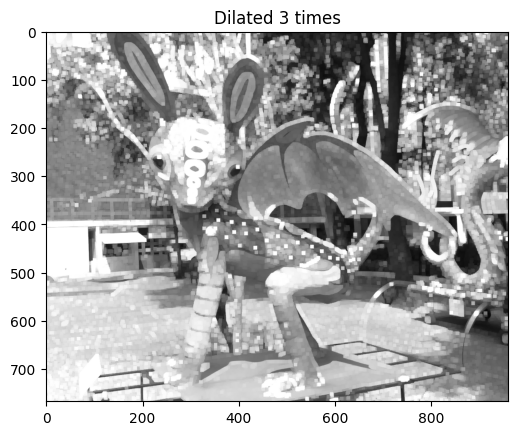

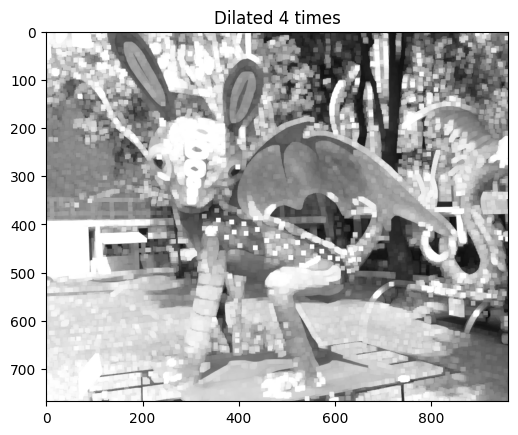

In [25]:
for i in range(0,4):
    dilated = cv2.dilate(BGR2GRAY.copy(),None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),dilated)

## Opening <a class="anchor" id="opening" ></a>

Erosion followed by dilation in outer surface (foreground) of image
- Generally used to remove noise (small blobs) in image


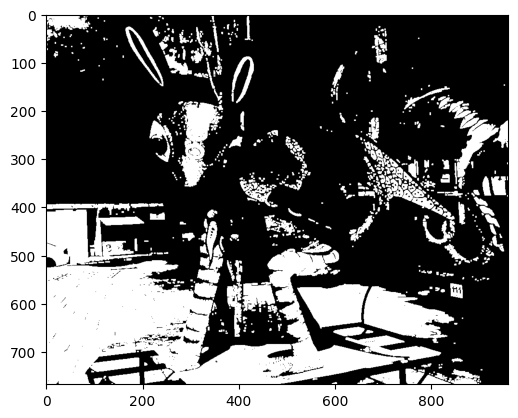

In [26]:
#opening image
opening = cv2.morphologyEx(binr,cv2.MORPH_OPEN,kernel,iterations=1)

#print output
plt.imshow(opening, cmap='gray')
plt.show()

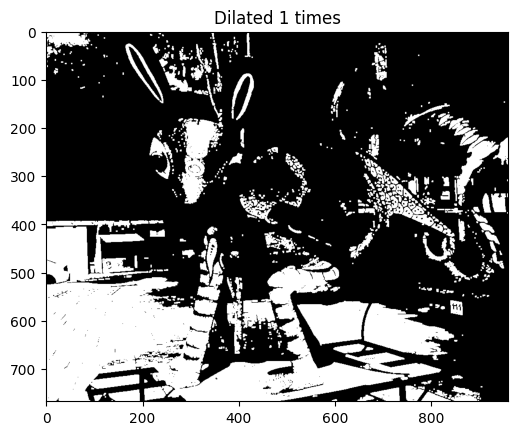

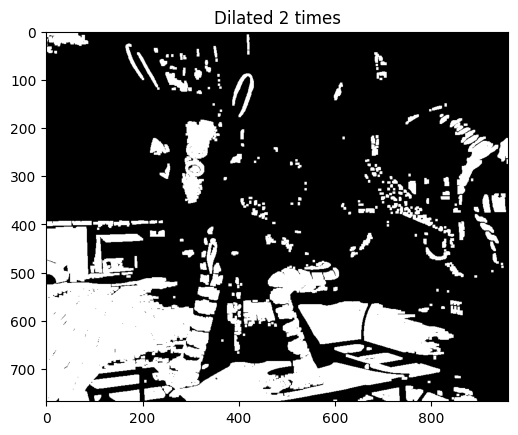

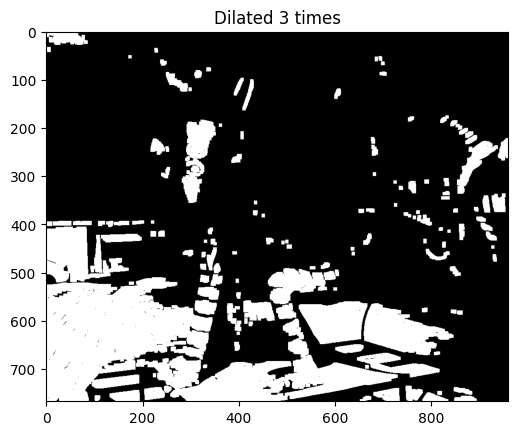

In [27]:
for i in range(0,3):
    opening = cv2.morphologyEx(binr.copy(),cv2.MORPH_OPEN,None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),opening)
    plt.show()

## Closing <a class="anchor" id="closing" ></a>

Dilation followed by erosion in outer surface (foreground) of image
- Generally used to close holes inside of objects or for connecting components together

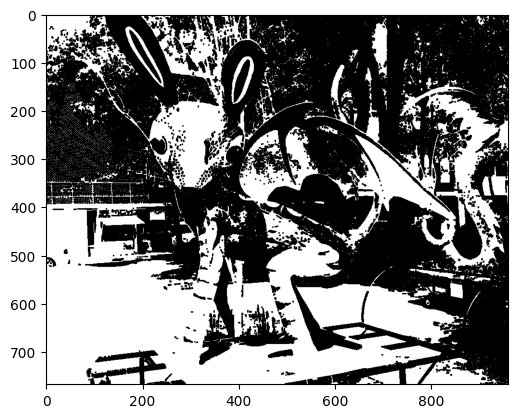

In [28]:
#closing image
closing = cv2.morphologyEx(binr, cv2.MORPH_CLOSE, kernel, iterations=1)
 
#print output
plt.imshow(closing,cmap='gray')
plt.show()

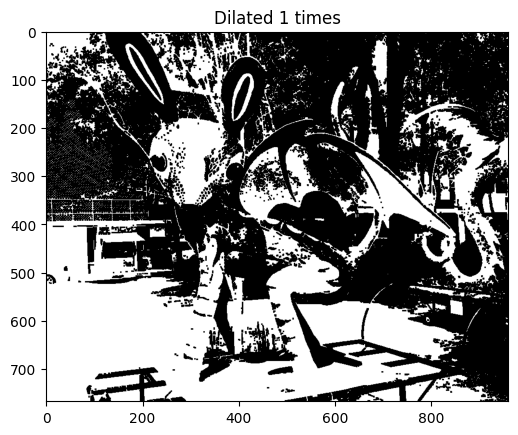

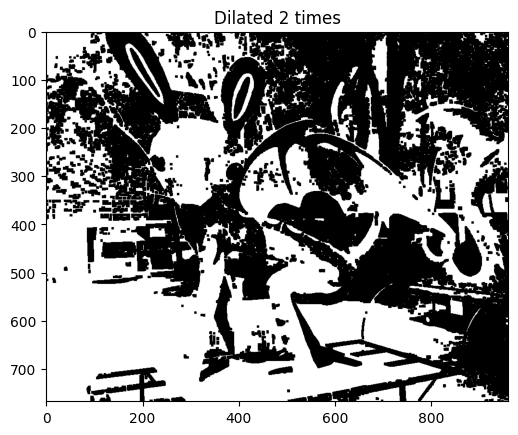

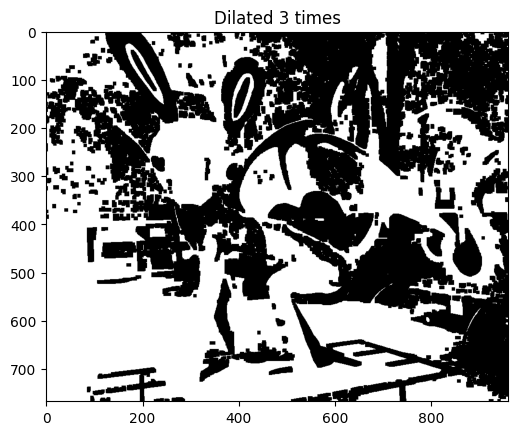

In [29]:
for i in range(0,3):
    closing = cv2.morphologyEx(binr.copy(),cv2.MORPH_CLOSE,None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),closing)
    plt.show()

Iterating with different kernels

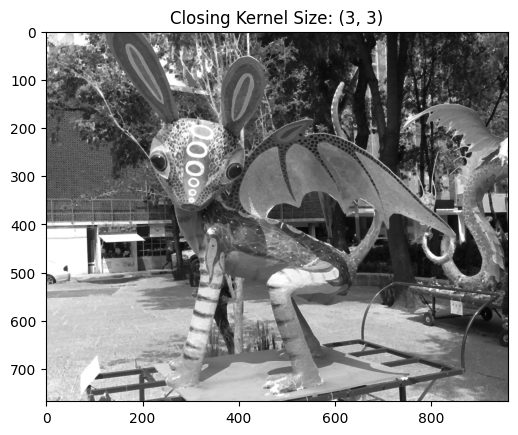

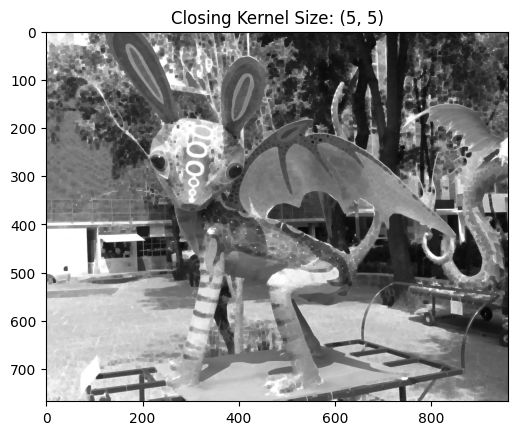

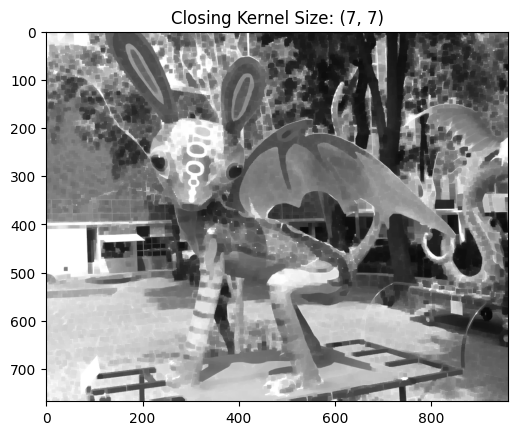

In [30]:
kernelSizes = [(3,3), (5,5), (7,7)]
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

for kernelSize in kernelSizes:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
    closing = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_CLOSE, kernel)
    plt_imshow("Closing Kernel Size: ({}, {})".format(kernelSize[0], kernelSize[1]), closing)

## Morphological Gradient <a class="anchor" id="gradient" ></a>

It first applies erosion and dilation individually on image and then computes difference between eroded and dilated image

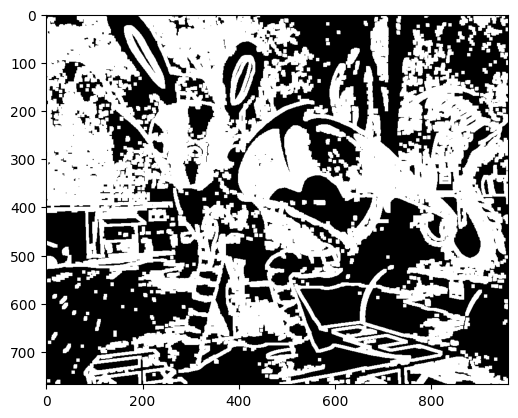

In [31]:
# use morph gradient
morph_gradient = cv2.morphologyEx(invert,cv2.MORPH_GRADIENT,kernel)
 
#print output
plt.imshow(morph_gradient, cmap='gray')
plt.show()

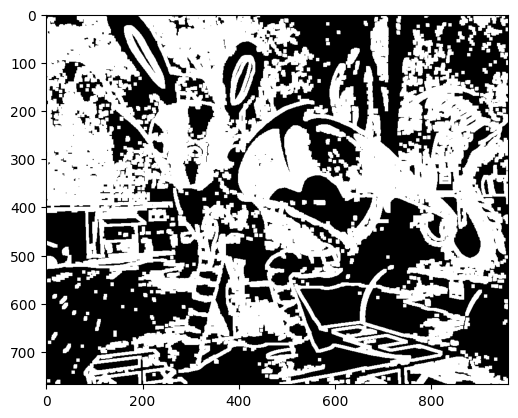

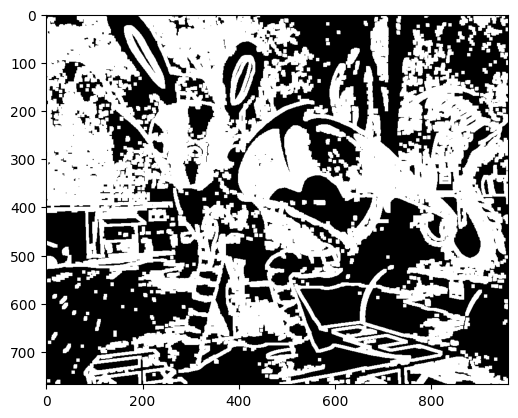

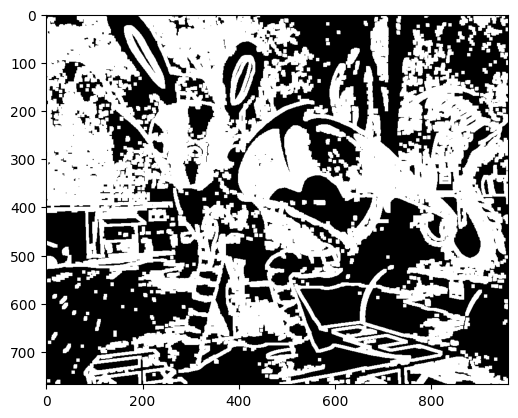

In [32]:
for i in range(0,3): 
    # use morph gradient
    morph_gradient = cv2.morphologyEx(invert,cv2.MORPH_GRADIENT,kernel+i)
    #print output
    plt.imshow(morph_gradient, cmap='gray')
    plt.show()

Iterating with different kernels

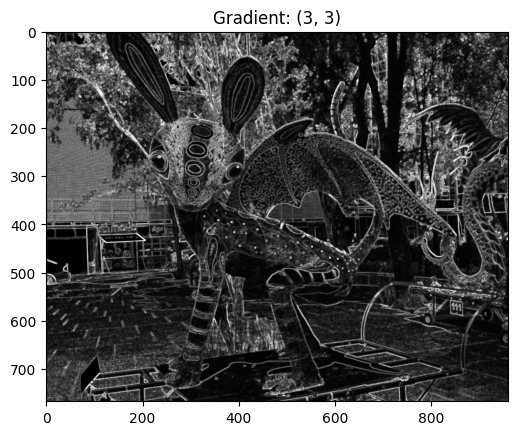

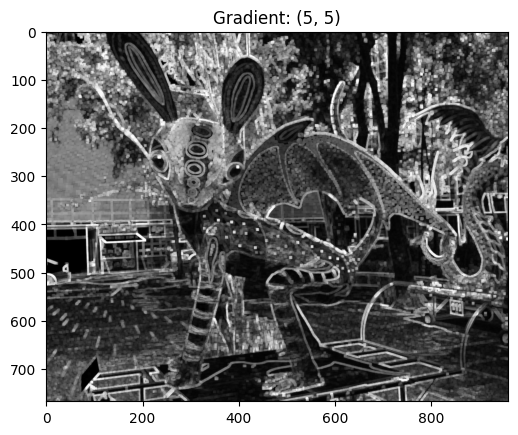

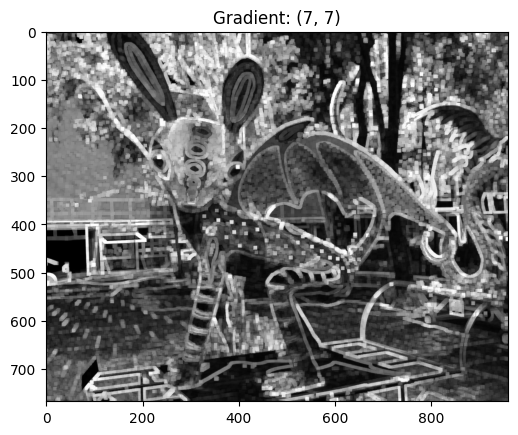

In [33]:
kernelSizes = [(3,3), (5,5), (7,7)]
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

for kernelSize in kernelSizes:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
    gradient = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_GRADIENT, kernel)
    plt_imshow("Gradient: ({}, {})".format(
        kernelSize[0], kernelSize[1]), gradient)

## Morphological Hats <a class="anchor" id="hats" ></a>

1. Top or White Hat
2. Black hat

### Top or White Hat <a class="anchor" id="top" ></a>

It is the difference between original (grayscale/single channel) input image and opening image

- Finds light(bright) regions of an image on dark background


In [34]:
#construct a kernel (13x5)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(13,5))
kernel

array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=uint8)

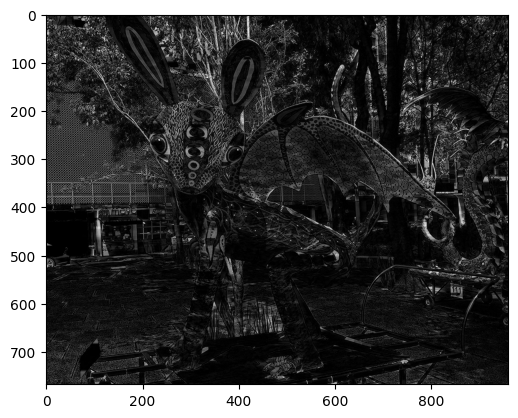

In [35]:
tophat = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_TOPHAT, kernel)

plt.imshow(tophat, cmap='gray')
plt.show()

### Black Hat <a class="anchor" id="black" ></a>

Output is a difference between input image & opened image
- Finds dark regions on a light background


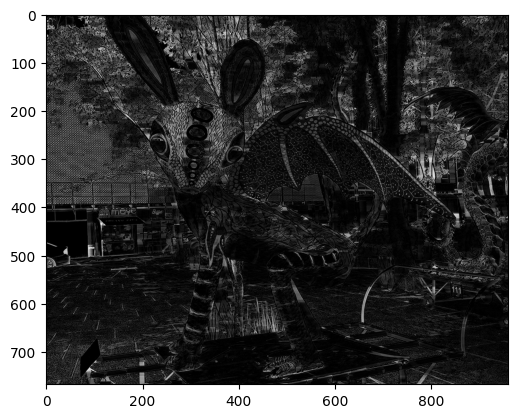

In [36]:
blackhat = cv2.morphologyEx(BGR2GRAY,cv2.MORPH_BLACKHAT,kernel)

plt.imshow(blackhat, cmap='gray')
plt.show()

# **Challenge**

> En esta sesión profundizaremos en el estudio de las técnicas de mejoramiento de imágenes usando técnicas basadas en operadores morfológicos en el dominio espacial. Los temas discutidos de forma teórica en la clase previa serán abordados aquí de forma teórica usando Google Colab.



## **1. Erosión**

> Investigar una aplicación de erosión en procesamiento de imágenes e implementarlo en Colab

La operación de erosión es una de las operaciones morfológicas más importantes la cual sigue una técnica de morfología matemática para el análisis y procesamiento de estructuras geométricas. Para tener una idea general de lo que la erosión tiene que ver con las imágenes, podemos pensar en esto como una operación en la que intenta reducir la forma contenida en la imagen de entrada. Es como la erosión del suelo, pero esta operación erosiona los límites del objeto en primer plano.

La representación matemática es sencilla, siguien la forma:

$$
A\circleddash B 
$$

Donde
- $A$ = Imagen de entrada
- $B$ = Elemento estructurante o kernel 

El resultado de esta operación da origen a la imagen erosinada. El elemento estructurante funciona como una convolución 2D

A continuación serán presentados dos escenarios del método de erosión. El primero es usando código python puro y el segundo usando la librería de OpenCV

### *1.1. Erosión usando Python*

In [38]:
import numpy as np
import cv2
import json
from matplotlib import pyplot as plt

In [47]:
img = cv2.imread("../data/semana_2/alebrije.jpg")
img_bin = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

In [49]:
img.shape, img_bin.shape

((768, 960, 3), (768, 960))

In [39]:
def convert_binary(image, threshold):
    
    """
    Función que permite binarizar la imagen en función de un umbral la cual recibe:
    - imagen
    - Valor del umbral
    Returns:
        - Imagen convolucionada
    """
    color_1 = 255
    color_2 = 0
    initial_conv = np.where((image <= threshold), image, color_1)
    final_conv = np.where((initial_conv > threshold), initial_conv, color_2)
    return final_conv

In [40]:
def binarize_this(image, threshold=127):
    image_b = convert_binary(image=image, threshold=threshold)
    return image_b

Para facilitar el cálculo, se rellena la imagen con un pad_width igual a (tamaño del kernel - 2) con el que se puede seleccionar fácilmente la submatriz.

In [41]:
def erode_this(image, kernel=3):
    kernel = 3 if kernel < 3 else kernel

    # Kernel como estructurante para realizar la operación matemática de erosión
    structuring_kernel = np.full(shape=(kernel, kernel), fill_value=255)
    image_src = binarize_this(image=image)

    # pad_with para la creación de la matrix
    orig_shape = image_src.shape
    pad_width = kernel - 2

    image_pad = np.pad(array=image_src, pad_width=pad_width, mode='constant')
    pimg_shape = image_pad.shape
    h_reduce, w_reduce = (pimg_shape[0] - orig_shape[0]), (pimg_shape[1] - orig_shape[1])

    # Creación de las submatrices del tamaño del kernel
    flat_submatrices = np.array([
        image_pad[i:(i + kernel), j:(j + kernel)]
        for i in range(pimg_shape[0] - h_reduce) for j in range(pimg_shape[1] - w_reduce)
    ])

    # Condición que permite reemplazar los valor de la submatrix
    # Si el kernel es igual a la submatriz, un valore de 255 de lo contrario 0
    image_erode = np.array([255 if (i == structuring_kernel).all() else 0 for i in flat_submatrices])
    image_erode = image_erode.reshape(orig_shape)

    return image_erode

In [54]:
def display(diccionario=None, nrow=None, ncol=None,  vmin=0.0, vmax=1.0):
    """
    Función que permite crea la cantidad de imágenes necesarias
    en función de un diccionario que las contenga
    Returns:
        Imagenes a ser observadas
    """
    fig = plt.figure(figsize=(20, 20))

    for raw, col in enumerate(diccionario):
        img = fig.add_subplot(nrow, ncol, raw + 1)
        img.set_title(f"{col}")
        img.imshow(diccionario[col],  cmap='gray' , vmin=vmin, vmax=vmax)

In [51]:
erosion = 3
image_erode = erode_this(img_bin, kernel=erosion)

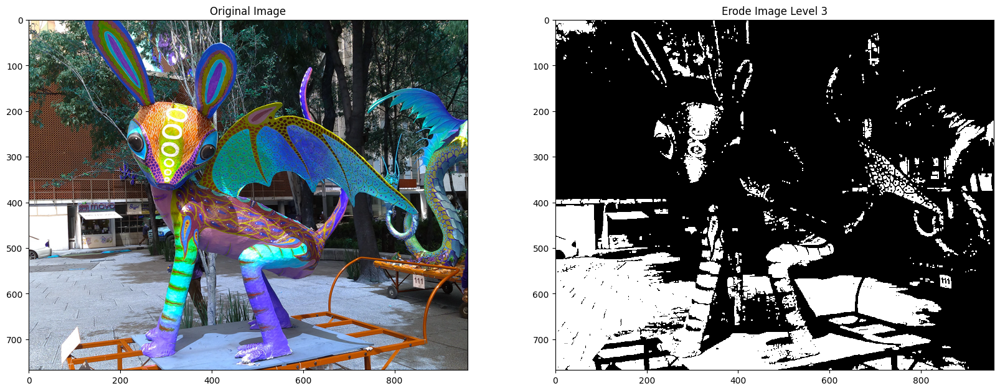

In [55]:
dict_images = {'Original Image':img, f'Erode Image Level {erosion}':image_erode}
display(dict_images, nrow=1, ncol=2)

### *1.2. Erosión usando OpenCV*

In [57]:
def erode_lib(image, kernel=3):
    kernel = 3 if kernel < 3 else kernel
    image_src = binarize_this(image=image)

    image_eroded = cv2.erode(src=image_src, kernel=np.ones((kernel, kernel)), iterations=1)
    
    return image_eroded

In [59]:
erosion = 3
image_erode = erode_lib(img_bin, kernel=erosion)

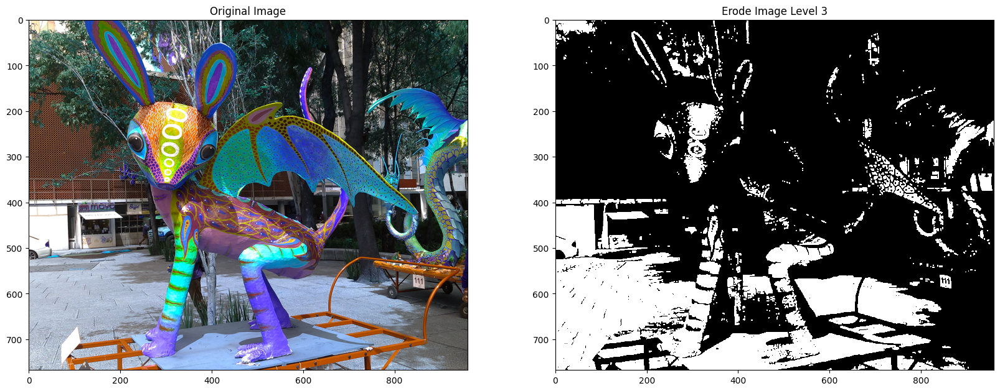

In [60]:
dict_images = {'Original Image':img, f'Erode Image Level {erosion}':image_erode}
display(dict_images, nrow=1, ncol=2)